<a href="https://colab.research.google.com/github/HuyKhoi-code/basic-CV/blob/main/blending%26double_exposure.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

remove background


In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

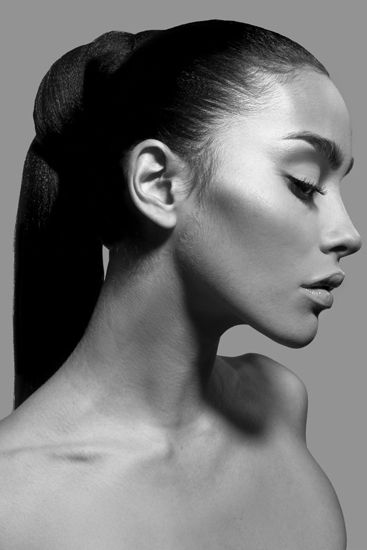

In [ ]:
img = cv2.imread ('/content/girl.jpg')
cv2_imshow (img)

In [ ]:
BLUR = 21
CANNY_THRESH_1 = 10
CANNY_THRESH_2 = 30
MASK_DILATE_ITER = 10
MASK_ERODE_ITER = 10
MASK_COLOR = (0.0,0.0,0.0)

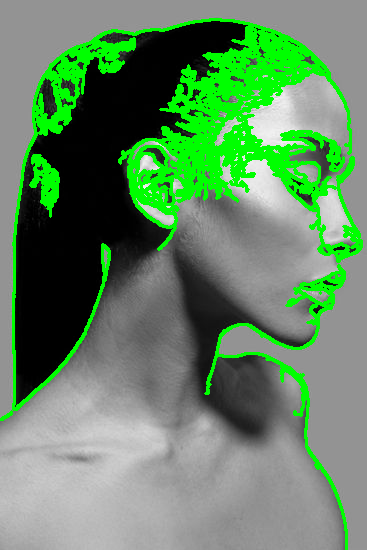

In [ ]:
im = img.copy()
gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny (gray, 10, 200)
contours,_ = cv2.findContours (edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
cv2.drawContours(im, contours, -1, (0, 255, 0), 2)
cv2_imshow (im)

In [ ]:
im = cv2.imread('/content/SYxmp.jpg')
gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, CANNY_THRESH_1, CANNY_THRESH_2)
edges = cv2.dilate(edges, None)
edges = cv2.erode(edges, None)
contour_info = []
contours,_ = cv2.findContours (edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
for c in contours:
    contour_info.append((
        c,
        cv2.isContourConvex(c),
        cv2.contourArea(c),
    ))
contour_info = sorted(contour_info, key=lambda c: c[2], reverse=True)
max_contour = contour_info[0]

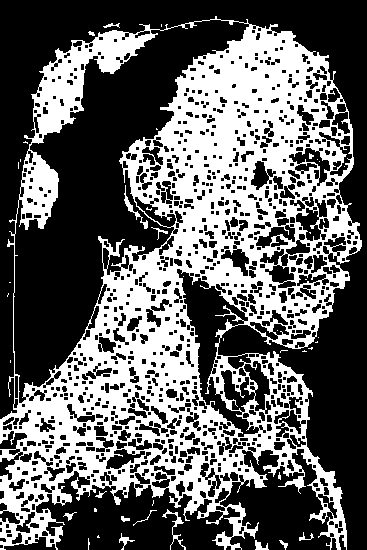

In [ ]:
cv2_imshow (edges)

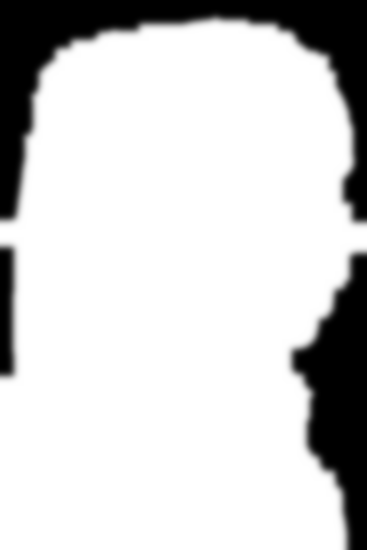

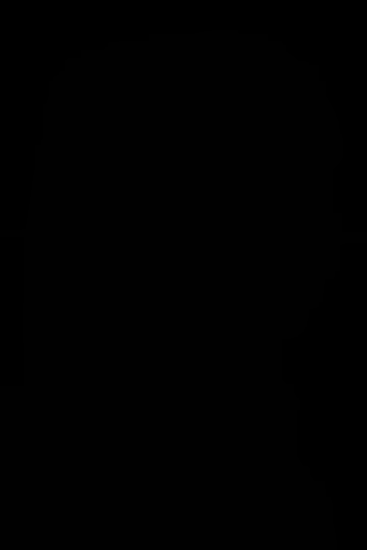

In [ ]:
mask = np.zeros(edges.shape)
cv2.fillConvexPoly(mask, max_contour[0], (255))
mask = cv2.dilate(mask, None, iterations=MASK_DILATE_ITER)
mask = cv2.erode(mask, None, iterations=MASK_ERODE_ITER)
mask = cv2.GaussianBlur(mask, (BLUR, BLUR), 0)
cv2_imshow (mask)
mask_stack = np.dstack([mask]*3)
mask_stack  = mask_stack.astype('float32') / 255.0
cv2_imshow(mask_stack)

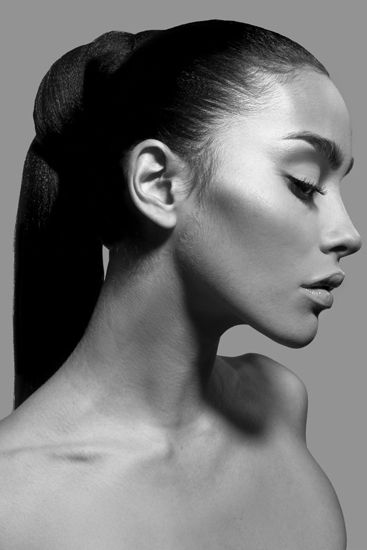

In [ ]:
img = cv2.imread ('/content/girl.jpg')
cv2_imshow (img)

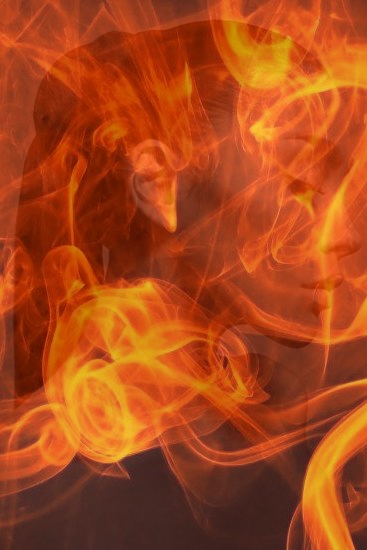

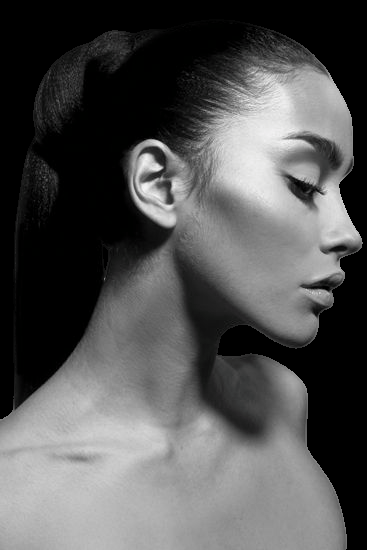

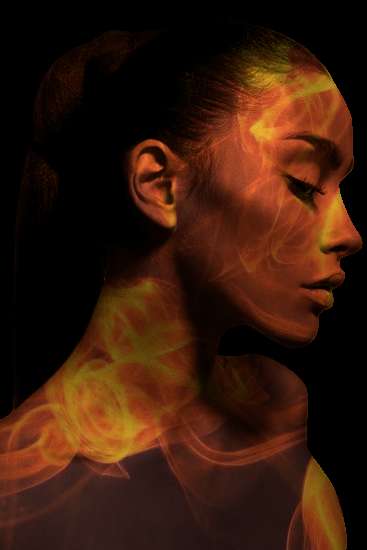

In [ ]:
flame = cv2.imread ('/content/fire.jpg')
im = img*0.2 + flame*0.8
cv2_imshow(im)
im = im.astype('float32') / 255.0
mask = cv2.imread ('/content/mask.png')
cv2_imshow (mask)
#print (mask)
mask = mask.astype('float32')/255
#print (mask)
#cv2_imshow (((mask * im + 1-mask)*255).astype('uint8'))
#print (((1-mask)*MASK_COLOR).sum())
masked = (mask * im)
masked = (masked * 255).astype('uint8')
cv2_imshow (masked)

In [ ]:
test = img.copy()
for i in range (test.shape[0]):
    for j in range (test.shape[1]):
        if (np.sum(masked[i,j,:],axis = -1) == 0):
            masked[i,j,:] += test[i,j,:]
print (masked)

[[[147 147 147]
  [147 147 147]
  [147 147 147]
  ...
  [147 147 147]
  [147 147 147]
  [147 147 147]]

 [[147 147 147]
  [147 147 147]
  [147 147 147]
  ...
  [147 147 147]
  [147 147 147]
  [147 147 147]]

 [[147 147 147]
  [147 147 147]
  [147 147 147]
  ...
  [147 147 147]
  [147 147 147]
  [147 147 147]]

 ...

 [[ 20  24  47]
  [ 20  24  48]
  [ 20  25  50]
  ...
  [147 147 147]
  [147 147 147]
  [147 147 147]]

 [[ 19  23  46]
  [ 20  23  46]
  [ 20  24  49]
  ...
  [148 148 148]
  [148 148 148]
  [148 148 148]]

 [[ 19  23  45]
  [ 19  23  46]
  [ 19  23  48]
  ...
  [148 148 148]
  [148 148 148]
  [148 148 148]]]


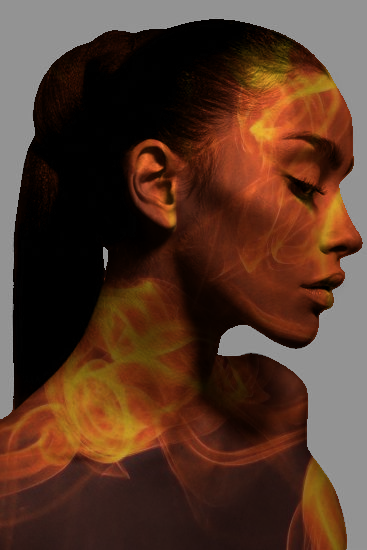

In [ ]:
cv2_imshow(masked)

In [10]:
girl = cv2.imread ('/content/girl.jpg')
girl.shape

(550, 367, 3)

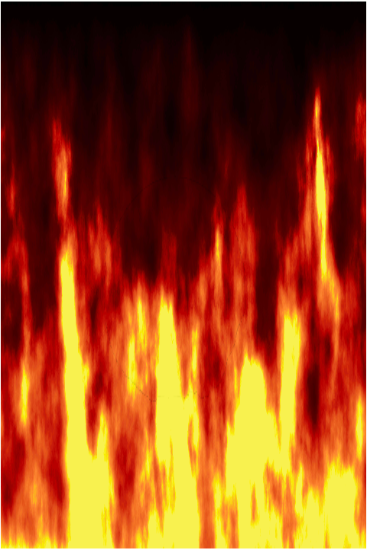

(550, 367, 3)


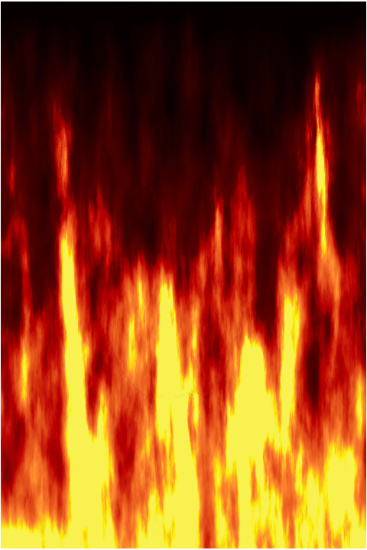

(550, 367, 3)


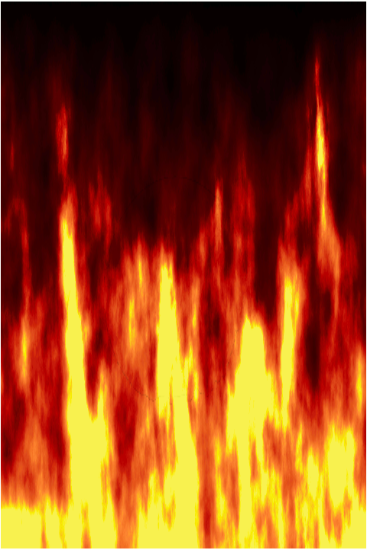

(550, 367, 3)


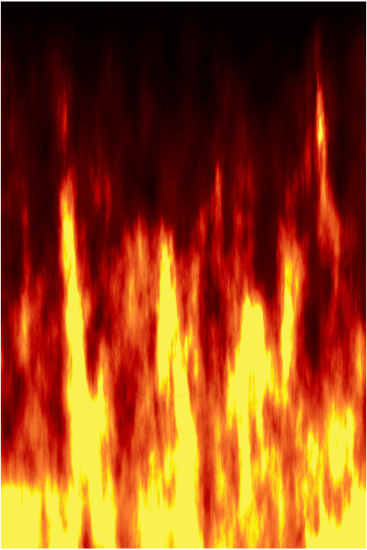

(550, 367, 3)


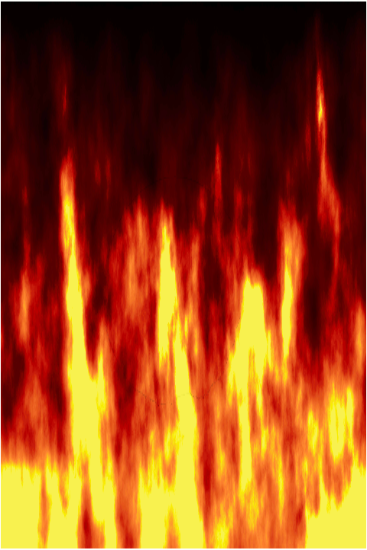

(550, 367, 3)


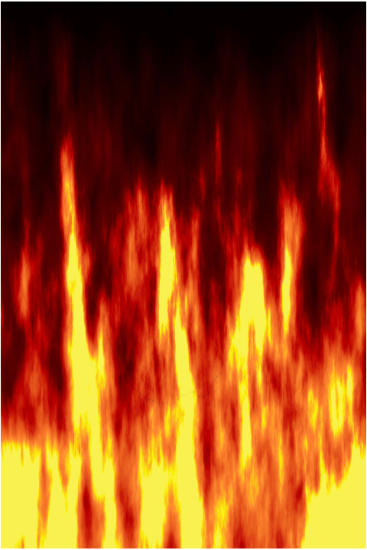

(550, 367, 3)


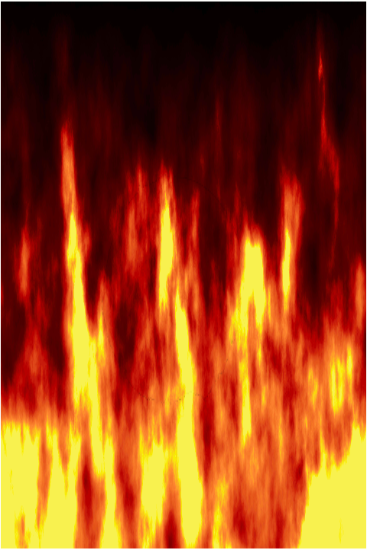

(550, 367, 3)


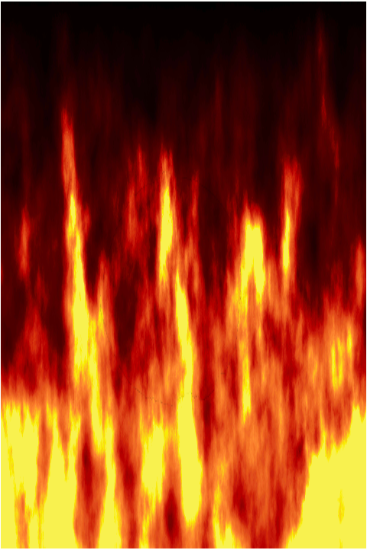

(550, 367, 3)


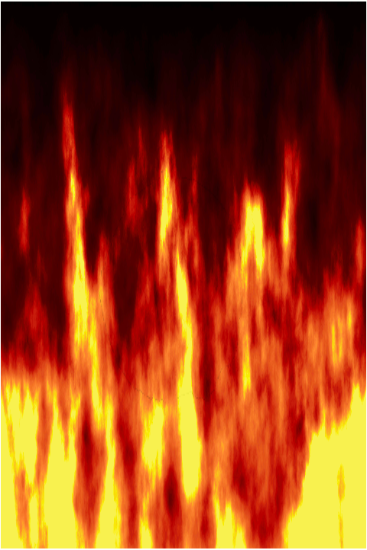

(550, 367, 3)


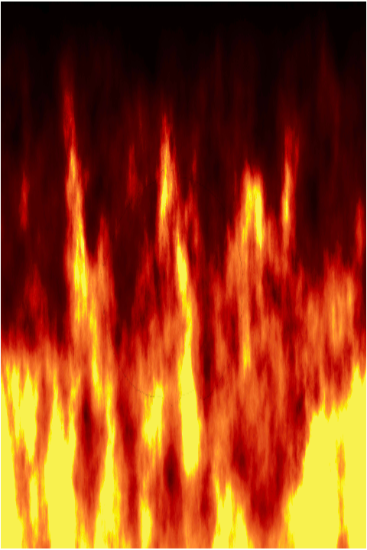

(550, 367, 3)


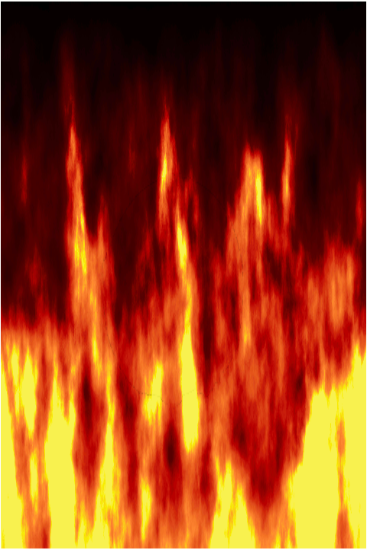

(550, 367, 3)


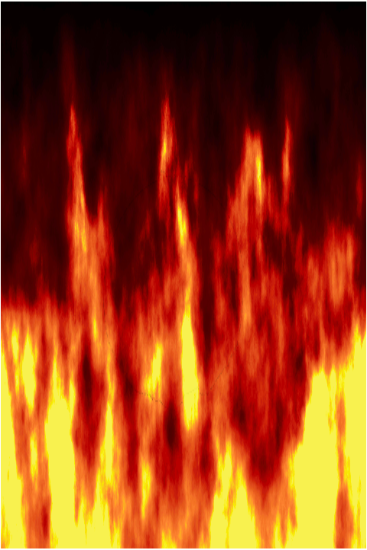

(550, 367, 3)


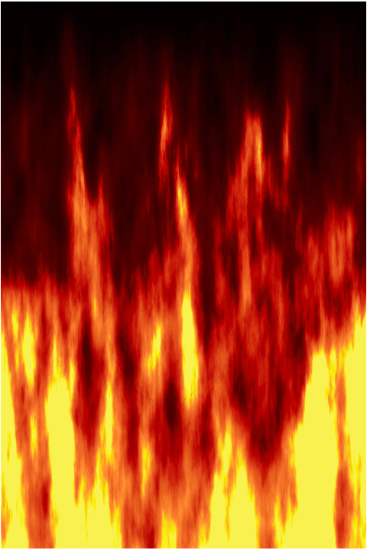

(550, 367, 3)


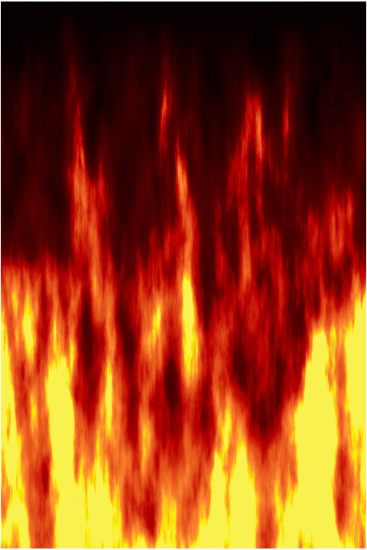

(550, 367, 3)


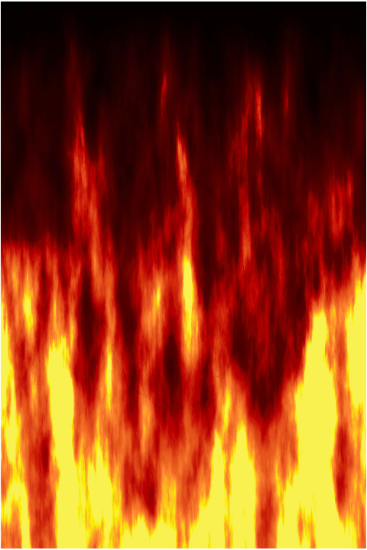

(550, 367, 3)


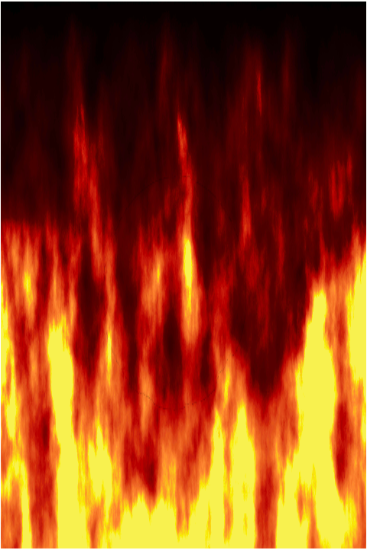

(550, 367, 3)


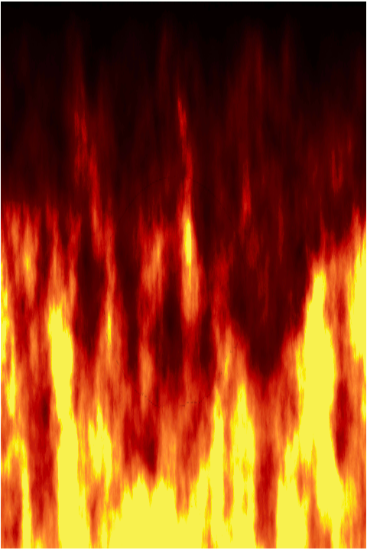

(550, 367, 3)


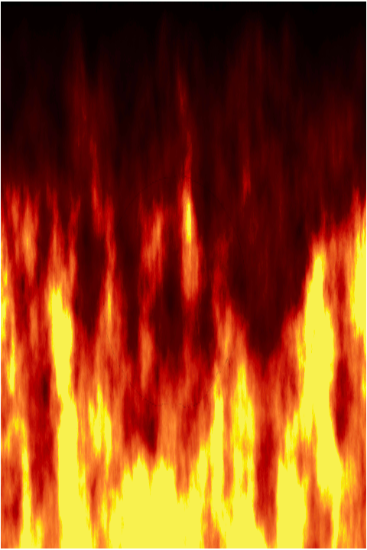

(550, 367, 3)


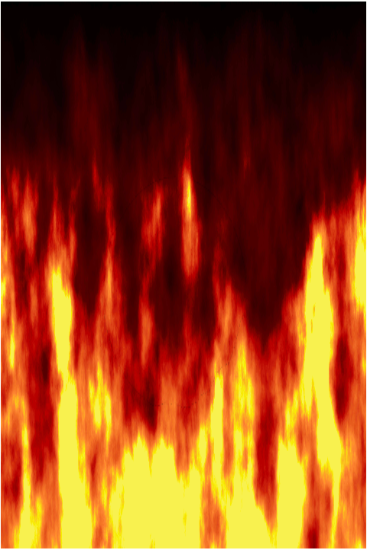

(550, 367, 3)


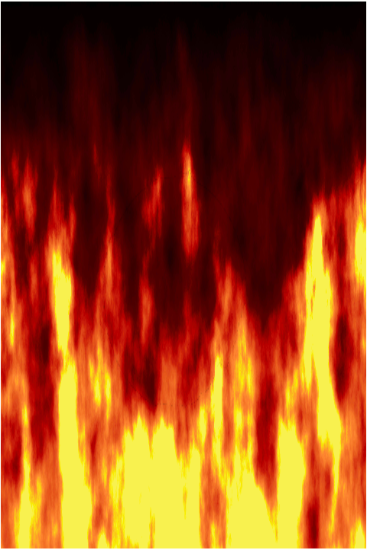

(550, 367, 3)


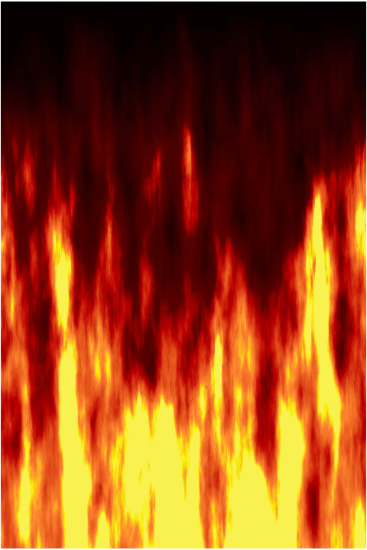

(550, 367, 3)


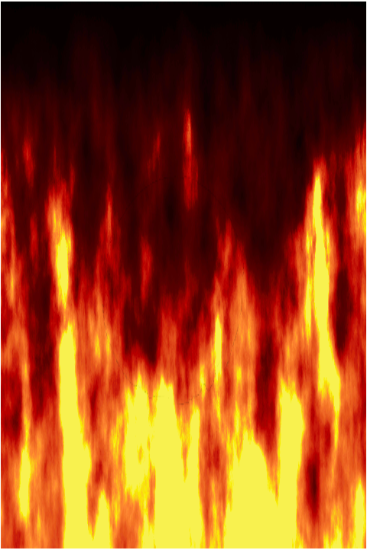

(550, 367, 3)


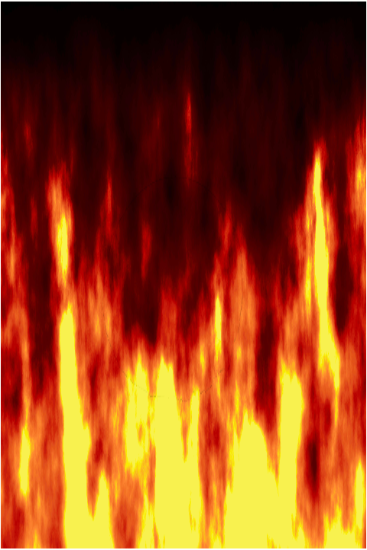

(550, 367, 3)


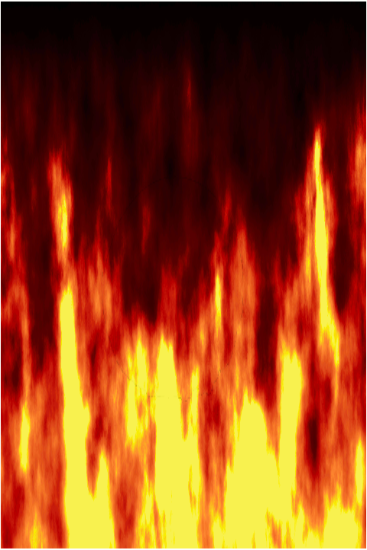

(550, 367, 3)


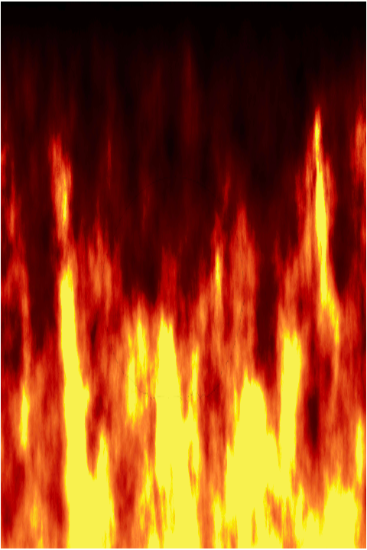

(550, 367, 3)


In [18]:
vid = cv2.VideoCapture('/content/Animated_fire_by_nevit.gif')
frame_array = []
frame_width = 367
frame_height = 550
#out = cv2.VideoWriter('outpy.avi',cv2.VideoWriter_fourcc('M','J','P','G'), 10, (frame_width,frame_height))

if (vid.isOpened() == False):
    print ('error')
while (vid.isOpened() == True):
    ret, frame = vid.read()
    if (ret == True):
        frame = cv2.resize(frame, (367,550))
        frame_array.append(frame)
        #out.write(frame)
        cv2_imshow (frame)
        print (frame.shape)
        if (cv2.waitKey(25) &  0xFF == ord('q')):
            break
    else:
        break
vid.release()
#out.release()

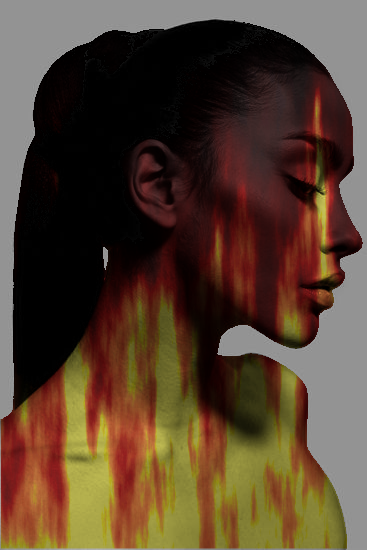

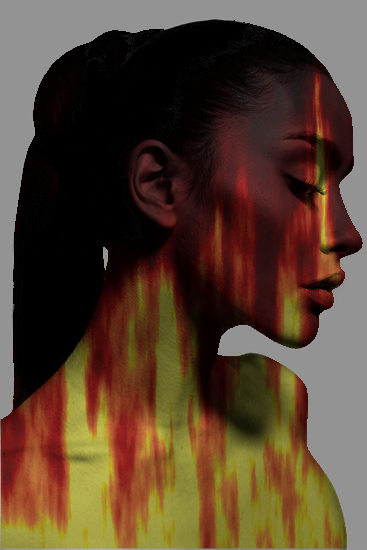

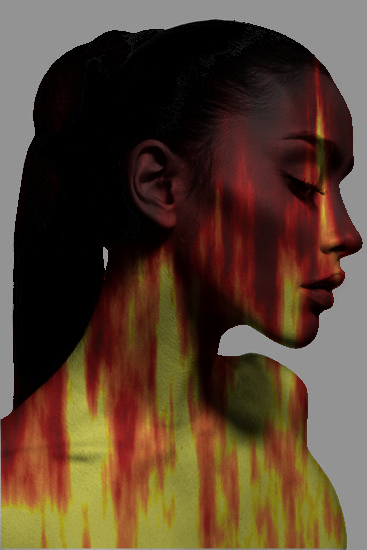

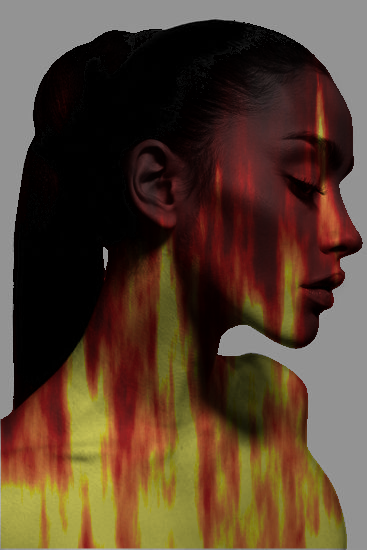

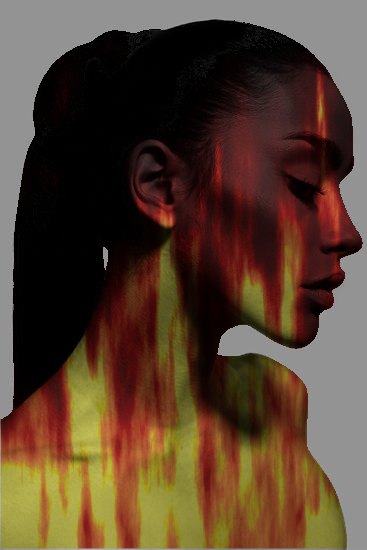

...

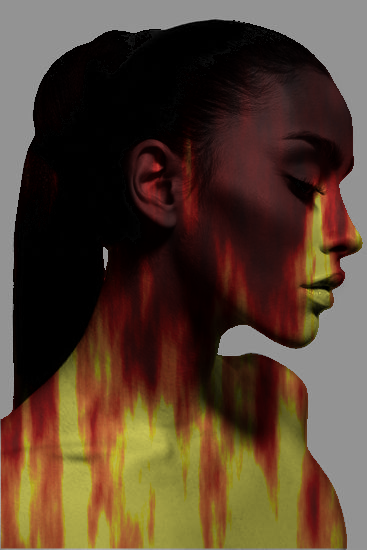

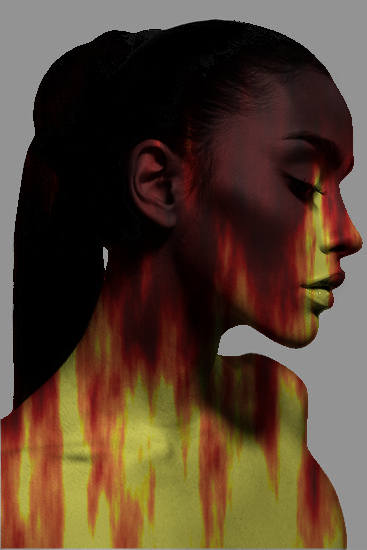

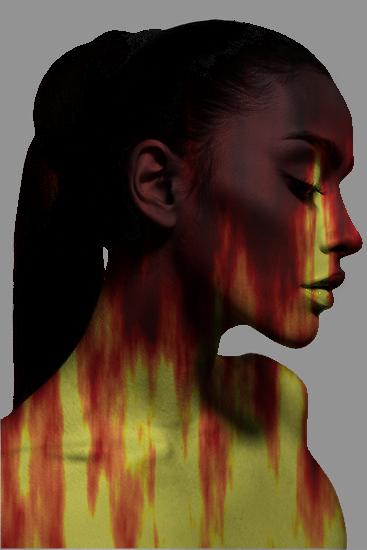

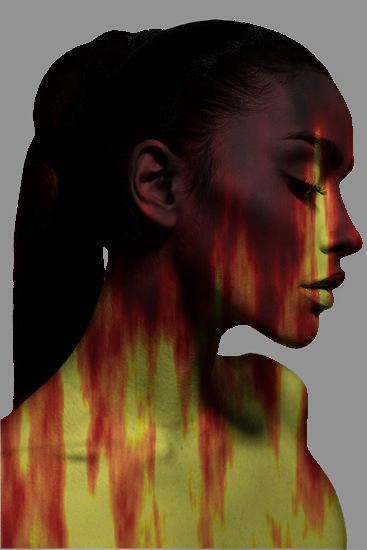

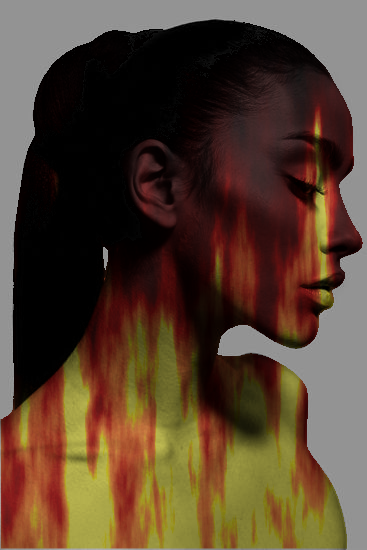

In [29]:
def blend(mask, frame, girl):
    im = girl * 0.2 + frame * 0.8
    im = im.astype('float32') / 255
    mask = mask.astype ('float32') /255

    masked = im *mask
    masked = (masked * 255).astype ('uint8')
    test = girl.copy()
    for i in range (test.shape[0]):
        for j in range (test.shape[1]):
            if (np.sum(masked[i,j,:],axis = -1) == 0):
                masked[i,j,:] += test[i,j,:]
    return masked
final = []
for frame in frame_array:
    mask = cv2.imread ('/content/mask.png')
    girl = cv2.imread ('/content/girl.jpg')
    result = blend (mask, frame, girl)
    final.append (result)
    cv2_imshow(result)

In [30]:
height, width, layers = final[0].shape
size = (width, height)
out = cv2.VideoWriter('project2.avi',cv2.VideoWriter_fourcc('M','J','P','G'), 15, size)
for im in final:
    out.write(im)
out.release()